In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import seaborn as sns

In [2]:
# read dataset
df = pd.read_csv("click.csv")
df

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Ad Topic Line,City,Gender,Country,Timestamp,Clicked on Ad
0,62.26,32.0,69481.85,172.83,Decentralized real-time circuit,Lisafort,Male,Svalbard & Jan Mayen Islands,2016-06-09 21:43:05,0
1,41.73,31.0,61840.26,207.17,Optional full-range projection,West Angelabury,Male,Singapore,2016-01-16 17:56:05,0
2,44.40,30.0,57877.15,172.83,Total 5thgeneration standardization,Reyesfurt,Female,Guadeloupe,2016-06-29 10:50:45,0
3,59.88,28.0,56180.93,207.17,Balanced empowering success,New Michael,Female,Zambia,2016-06-21 14:32:32,0
4,49.21,30.0,54324.73,201.58,Total 5thgeneration standardization,West Richard,Female,Qatar,2016-07-21 10:54:35,1
...,...,...,...,...,...,...,...,...,...,...
9995,41.73,31.0,61840.26,207.17,Profound executive flexibility,West Angelabury,Male,Singapore,2016-01-03 03:22:15,1
9996,41.73,28.0,51501.38,120.49,Managed zero tolerance concept,Kennedyfurt,Male,Luxembourg,2016-05-28 12:20:15,0
9997,55.60,39.0,38067.08,124.44,Intuitive exuding service-desk,North Randy,Female,Egypt,2016-01-05 11:53:17,0
9998,46.61,50.0,43974.49,123.13,Realigned content-based leverage,North Samantha,Female,Malawi,2016-04-04 07:07:46,1


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Daily Time Spent on Site  10000 non-null  float64
 1   Age                       10000 non-null  float64
 2   Area Income               10000 non-null  float64
 3   Daily Internet Usage      10000 non-null  float64
 4   Ad Topic Line             10000 non-null  object 
 5   City                      10000 non-null  object 
 6   Gender                    10000 non-null  object 
 7   Country                   10000 non-null  object 
 8   Timestamp                 10000 non-null  object 
 9   Clicked on Ad             10000 non-null  int64  
dtypes: float64(4), int64(1), object(5)
memory usage: 781.4+ KB


In [5]:
print(f'lengh of Ad Topic Line {len(df["Ad Topic Line"].unique())},\nlengh of city {len(df["City"].unique())},\nlengh of country {len(df["Country"].unique())}')

lengh of Ad Topic Line 559,
lengh of city 521,
lengh of country 207


In [6]:
# remove some columns
df = df.drop(["City","Ad Topic Line","Timestamp"],axis=1)
df

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country,Clicked on Ad
0,62.26,32.0,69481.85,172.83,Male,Svalbard & Jan Mayen Islands,0
1,41.73,31.0,61840.26,207.17,Male,Singapore,0
2,44.40,30.0,57877.15,172.83,Female,Guadeloupe,0
3,59.88,28.0,56180.93,207.17,Female,Zambia,0
4,49.21,30.0,54324.73,201.58,Female,Qatar,1
...,...,...,...,...,...,...,...
9995,41.73,31.0,61840.26,207.17,Male,Singapore,1
9996,41.73,28.0,51501.38,120.49,Male,Luxembourg,0
9997,55.60,39.0,38067.08,124.44,Female,Egypt,0
9998,46.61,50.0,43974.49,123.13,Female,Malawi,1


In [7]:
# how much is 0 abd 1
df["Clicked on Ad"].value_counts()

Clicked on Ad
0    5083
1    4917
Name: count, dtype: int64

In [8]:
# train test split
train, test = train_test_split(df,test_size=0.3,random_state=42)
print("trian.shape",train.shape)
print("test.shape",test.shape)

trian.shape (7000, 7)
test.shape (3000, 7)


In [9]:
# new index for train and test
train_index = list(range(7000))
test_index = list(range(3000))

train.index = train_index
test.index = test_index

In [10]:
# convert string columns to int 
def string_to_int(data_set,l_preform=[]):
    # change columns gender
    data_set["Gender"] = data_set["Gender"].replace({"Male":1,"Female":0})
    # convert country columns to float 
    country_count = data_set["Country"].value_counts(sort=False)
    train_fake = data_set[["Country","Clicked on Ad"]]
    sum_country = train_fake.groupby("Country",sort=False).sum()
    sum_country = sum_country["Clicked on Ad"]
    for i in range(len(country_count)):
        l_preform.append(sum_country[i]/country_count[i])

    country_uniqe = data_set["Country"].unique()

    s_train = pd.DataFrame(country_uniqe,columns=["country"])
    s_train["preform"] = l_preform

    for i in range(len(data_set["Country"])):
        for j in range(len(s_train["country"])):
            if data_set["Country"][i] == s_train["country"][j]:
                data_set["Country"][i] = s_train["preform"][j]

    data_set["Country"] = pd.to_numeric(data_set["Country"])
    return data_set



In [11]:
train = string_to_int(train)

C:\Users\Asus\AppData\Local\Temp\ipykernel_14172\3128139415.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_set["Gender"] = data_set["Gender"].replace({"Male":1,"Female":0})
C:\Users\Asus\AppData\Local\Temp\ipykernel_14172\3128139415.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  l_preform.append(sum_country[i]/country_count[i])
C:\Users\Asus\AppData\Local\Temp\ipykernel_14172\3128139415.py:21: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, b

In [12]:
train

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country,Clicked on Ad
0,88.04,44.0,50723.67,137.24,0,0.500000,1
1,71.28,36.0,32549.95,141.52,1,0.830769,1
2,80.30,52.0,39031.89,113.80,0,0.840580,1
3,81.58,25.0,25686.34,141.89,1,0.130435,0
4,81.98,34.0,59785.94,160.03,0,0.209677,0
...,...,...,...,...,...,...,...
6995,82.07,41.0,57846.68,126.39,0,0.034965,1
6996,89.00,36.0,50628.31,126.39,1,0.909910,1
6997,78.84,35.0,25603.93,236.87,0,0.107692,0
6998,59.51,30.0,57877.15,138.71,1,0.341667,1


In [13]:
train.describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country,Clicked on Ad
count,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000,7000.000000
mean,61.804337,35.981286,53680.858793,177.253230,0.462143,0.494286,0.494286
std,15.734856,8.559488,13377.009628,40.843872,0.498600,0.348292,0.500003
min,32.600000,19.000000,13996.500000,105.220000,0.000000,0.000000,0.000000
25%,49.107500,29.000000,43974.490000,139.340000,0.000000,0.137931,0.000000
50%,59.590000,35.000000,56180.930000,178.920000,0.000000,0.478261,0.000000
75%,77.140000,42.000000,61840.260000,212.380000,1.000000,0.840580,1.000000
max,90.970000,60.000000,78520.990000,269.960000,1.000000,1.000000,1.000000


In [14]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7000 entries, 0 to 6999
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Daily Time Spent on Site  7000 non-null   float64
 1   Age                       7000 non-null   float64
 2   Area Income               7000 non-null   float64
 3   Daily Internet Usage      7000 non-null   float64
 4   Gender                    7000 non-null   int64  
 5   Country                   7000 non-null   float64
 6   Clicked on Ad             7000 non-null   int64  
dtypes: float64(5), int64(2)
memory usage: 695.5 KB


In [15]:
y_train = train["Clicked on Ad"]
x_train = train.drop("Clicked on Ad",axis=1)

In [16]:
# standard scaler (data mire to baze -1,1)
def scaler(data_set):
    scale = StandardScaler()
    data_set_val = data_set.values
    scale_data = scale.fit_transform(data_set_val)
    data_set_df = pd.DataFrame(scale_data,columns=data_set.columns)
    return data_set_df

In [17]:
x_train = scaler(x_train)
x_train

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country
0,1.667479,0.936889,-0.221081,-0.979733,-0.926946,0.016408
1,0.602251,0.002187,-1.579757,-0.874936,1.078811,0.966165
2,1.175542,1.871591,-1.095164,-1.553667,-0.926946,0.994334
3,1.256896,-1.283029,-2.092883,-0.865877,1.078811,-1.044747
4,1.282319,-0.231489,0.456419,-0.421715,-0.926946,-0.817213
...,...,...,...,...,...,...
6995,1.288039,0.586375,0.311439,-1.245398,-0.926946,-1.318875
6996,1.728494,0.002187,-0.228210,-1.245398,1.078811,1.193406
6997,1.082748,-0.114651,-2.099044,1.459730,-0.926946,-1.110048
6998,-0.145823,-0.698840,0.313717,-0.943740,1.078811,-0.438224


In [18]:
# fit algorithm
from sklearn.tree import DecisionTreeClassifier
tree = DecisionTreeClassifier(criterion="entropy",max_depth=20,max_features=5)
tree.fit(x_train,y_train)


DecisionTreeClassifier(criterion='entropy', max_depth=20, max_features=5)

In [19]:
# baresi hyper parameters
from sklearn.model_selection import GridSearchCV
params = {"max_depth":(None,20,45),"criterion":("gini","entropy",),"max_features":(None,"sqrt","log2",5,7.0,)}
cv = GridSearchCV(tree,params)
cv.fit(x_train,y_train)

c:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
30 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
30 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "c:\Users\Asus\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py", 

GridSearchCV(estimator=DecisionTreeClassifier(criterion='entropy', max_depth=20,
                                              max_features=5),
             param_grid={'criterion': ('gini', 'entropy'),
                         'max_depth': (None, 20, 45),
                         'max_features': (None, 'sqrt', 'log2', 5, 7.0)})

In [20]:
# metrics: 
from sklearn.metrics import accuracy_score
y_pred = tree.predict(x_train)
acc = accuracy_score(y_true=y_train,y_pred=y_pred)
acc

0.9864285714285714

In [21]:
# random forest
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(criterion='log_loss', max_depth=20, n_estimators=500)
forest.fit(x_train,y_train)
y_pred = forest.predict(x_train)
accuracy_score(y_true=y_train,y_pred=y_pred)

0.993

In [22]:
# hyper params for random forest
for_parms = {"n_estimators":(100,500,200),"criterion":("gini","entropy","log_loss"),"max_depth":(None,20,45)}
cv_for = GridSearchCV(forest,for_parms)
cv_for.fit(x_train,y_train)


GridSearchCV(estimator=RandomForestClassifier(criterion='log_loss',
                                              max_depth=20, n_estimators=500),
             param_grid={'criterion': ('gini', 'entropy', 'log_loss'),
                         'max_depth': (None, 20, 45),
                         'n_estimators': (100, 500, 200)})

In [23]:
# preprocesing in test:
test = string_to_int(test,l_preform=[])
test

C:\Users\Asus\AppData\Local\Temp\ipykernel_14172\3128139415.py:4: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data_set["Gender"] = data_set["Gender"].replace({"Male":1,"Female":0})
C:\Users\Asus\AppData\Local\Temp\ipykernel_14172\3128139415.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  l_preform.append(sum_country[i]/country_count[i])
C:\Users\Asus\AppData\Local\Temp\ipykernel_14172\3128139415.py:21: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, b

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country,Clicked on Ad
0,55.60,39.0,42993.48,115.26,1,0.224490,0
1,80.91,41.0,59243.46,112.52,0,0.037037,0
2,61.84,45.0,70053.27,174.88,0,0.940000,1
3,59.22,28.0,53058.91,140.46,0,0.085106,0
4,86.06,32.0,55424.24,178.92,1,0.380952,0
...,...,...,...,...,...,...,...
2995,82.07,48.0,65956.71,157.04,0,0.666667,1
2996,75.84,25.0,50506.44,241.03,0,0.940000,0
2997,47.64,29.0,69718.19,186.37,0,0.689655,1
2998,55.60,54.0,53188.69,182.20,0,0.555556,1


In [24]:
test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3000 entries, 0 to 2999
Data columns (total 7 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Daily Time Spent on Site  3000 non-null   float64
 1   Age                       3000 non-null   float64
 2   Area Income               3000 non-null   float64
 3   Daily Internet Usage      3000 non-null   float64
 4   Gender                    3000 non-null   int64  
 5   Country                   3000 non-null   float64
 6   Clicked on Ad             3000 non-null   int64  
dtypes: float64(5), int64(2)
memory usage: 252.0 KB


In [25]:
test.describe()

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country,Clicked on Ad
count,3000.000000,3000.000000,3000.000000,3000.00000,3000.000000,3000.000000,3000.000000
mean,61.325737,35.844000,54211.488553,178.94190,0.463000,0.485667,0.485667
std,15.629726,8.605019,13260.472019,40.74973,0.498712,0.356086,0.499878
min,32.600000,19.000000,13996.500000,105.22000,0.000000,0.000000,0.000000
25%,47.740000,29.000000,45632.510000,140.46000,0.000000,0.142857,0.000000
50%,59.510000,35.000000,56180.930000,180.47000,0.000000,0.500000,0.000000
75%,75.550000,41.000000,62669.590000,214.61000,1.000000,0.833333,1.000000
max,90.970000,60.000000,79332.330000,269.96000,1.000000,1.000000,1.000000


In [26]:
y_test = test["Clicked on Ad"]
x_test = test.drop("Clicked on Ad",axis=1)


In [27]:
x_test = scaler(x_test)
x_test

,Daily Time Spent on Site,Age,Area Income,Daily Internet Usage,Gender,Country
0,-0.366397,0.366824,-0.846115,-1.563017,1.076953,-0.733588
1,1.253223,0.599285,0.379535,-1.630268,-0.928546,-1.260101
2,0.032908,1.064208,1.194861,-0.099696,-0.928546,1.276121
3,-0.134749,-0.911713,-0.086933,-0.944505,-0.928546,-1.125085
4,1.582778,-0.446791,0.091471,-0.000538,1.076953,-0.294119
...,...,...,...,...,...,...
2995,1.327453,1.412899,0.885879,-0.537563,-0.928546,0.508389
2996,0.928787,-1.260405,-0.279452,1.523898,-0.928546,1.276121
2997,-0.875768,-0.795482,1.169588,0.182316,-0.928546,0.572958
2998,-0.366397,2.110283,-0.077144,0.079967,-0.928546,0.196302


In [28]:
# predict desion tree from test
y_pred_test_tree = tree.predict(x_test)
accuracy_score(y_true=y_test,y_pred=y_pred_test_tree)

0.777

In [30]:
# predict random forest
y_pred_test_forst = forest.predict(x_test)
accuracy_score(y_true=y_test,y_pred=y_pred_test_forst)

0.8456666666666667

DecisionTreeClassifier: CONFUSION REPORT


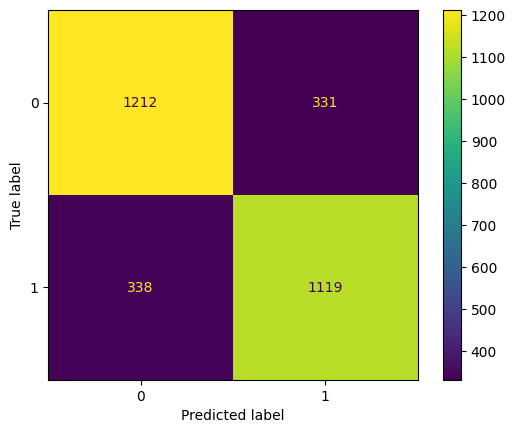

In [31]:
# ploting confiysin matrix
from sklearn.metrics import ConfusionMatrixDisplay
print("DecisionTreeClassifier: CONFUSION REPORT")
ConfusionMatrixDisplay.from_estimator(tree,x_test,y_test)

RandomForestClassifier: coinfusion matrix


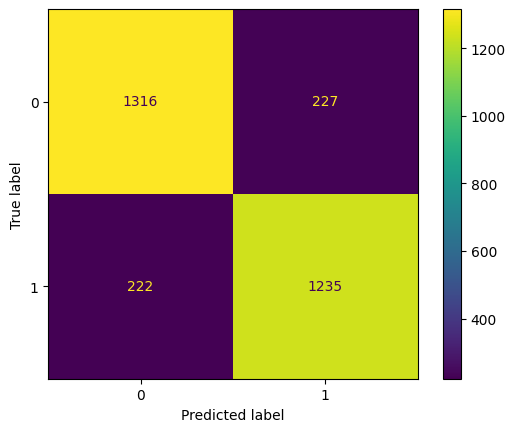

In [30]:
print("RandomForestClassifier: coinfusion matrix")
ConfusionMatrixDisplay.from_estimator(forest,x_test,y_test)

In [31]:
# classification report:
from sklearn.metrics import classification_report
print("DecisionTreeClassifier: ")
print(classification_report(y_true=y_test,y_pred=y_pred_test_tree))

DecisionTreeClassifier: 
              precision    recall  f1-score   support

           0       0.79      0.79      0.79      1543
           1       0.78      0.78      0.78      1457

    accuracy                           0.79      3000
   macro avg       0.79      0.79      0.79      3000
weighted avg       0.79      0.79      0.79      3000



In [32]:
print("RandomForestClassifier: ")
print(classification_report(y_true=y_test,y_pred=y_pred_test_forst))

RandomForestClassifier: 
              precision    recall  f1-score   support

           0       0.86      0.85      0.85      1543
           1       0.84      0.85      0.85      1457

    accuracy                           0.85      3000
   macro avg       0.85      0.85      0.85      3000
weighted avg       0.85      0.85      0.85      3000

